<center><h1>Hemnani_Hitika_HW5</h1></center>
<br>
<br>

Name: Hitika Hemnani
<br>
Github Username: hhemnani
<br>
USC ID: 8304678802

## 1. Decision Trees as Interpretable Models

Import packages

In [6]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier, plot_tree, export_text
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.multioutput import MultiOutputClassifier
import matplotlib.pyplot as plt

### (a) Obtain Data

Get the Accute Inamations Data Set

In [7]:
column_names = ['Temp', 'Nausea', 'Lumbar_Pain', 'Urine_Pushing', 
                'Micturition_Pain', 'Burning_Urethra', 'Inflammation', 'Nephritis']

# Reading the dataset from a file while specifying column names, encoding, decimal format, and delimiter
diagnosis_data = pd.read_csv("../data/diagnosis.data", header=None, names=column_names,encoding='UTF_16', decimal=',',delimiter='\t')
# Replacing categorical values 'yes' and 'no' with numerical values 1 and 0
diagnosis_data = diagnosis_data.replace({'yes': 1, 'no': 0})

diagnosis_data

C:\Users\Hritika\AppData\Local\Temp\ipykernel_45432\3482952023.py:7: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  diagnosis_data = diagnosis_data.replace({'yes': 1, 'no': 0})


,Temp,Nausea,Lumbar_Pain,Urine_Pushing,Micturition_Pain,Burning_Urethra,Inflammation,Nephritis
0,35.5,0,1,0,0,0,0,0
1,35.9,0,0,1,1,1,1,0
2,35.9,0,1,0,0,0,0,0
3,36.0,0,0,1,1,1,1,0
4,36.0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...
115,41.4,0,1,1,0,1,0,1
116,41.5,0,0,0,0,0,0,0
117,41.5,1,1,0,1,0,0,1
118,41.5,0,1,1,0,1,0,1


### (b) Build a decision tree

##### Decision Tree for Inflammation

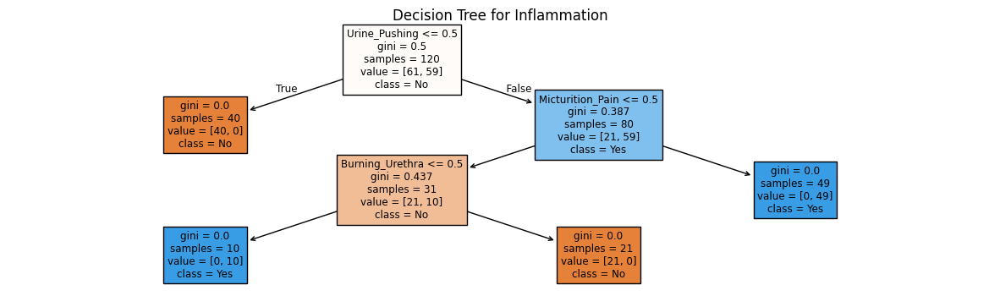

In [8]:
X = diagnosis_data.drop(['Inflammation', 'Nephritis'], axis=1)
# Extracting the target variable 'Inflammation' from the dataset 
y1 = diagnosis_data['Inflammation']

# Creating a decision tree classifier with a maximum depth of 3 and setting a random seed 
tree = DecisionTreeClassifier(max_depth=3, random_state=7)

# Training the decision tree model using the feature matrix X and target variable y1
tree.fit(X, y1)

# Plotting the first tree
plt.figure(figsize=(15, 4))
plot_tree(tree, feature_names=X.columns, class_names=['No', 'Yes'], filled=True)
plt.title(f'Decision Tree for {'Inflammation'}')
plt.show()



##### Decision Tree for Nephritis

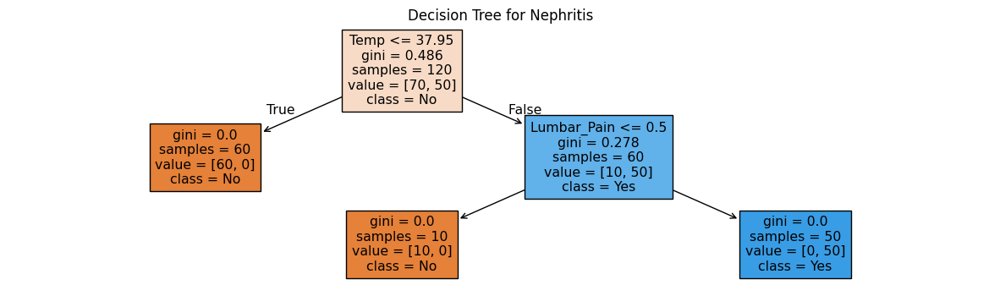

In [9]:
# Extracting the target variable 'Nephritis' from the dataset  
y2 = diagnosis_data['Nephritis']

# Creating a decision tree classifier with a maximum depth of 3 and setting a random seed  
tree = DecisionTreeClassifier(max_depth=3, random_state=7)

# Training the decision tree model using the feature matrix X and target variable y2  
tree.fit(X, y2)

# Plotting the Second tree
plt.figure(figsize=(15, 4))
plot_tree(tree, feature_names=X.columns, class_names=['No', 'Yes'], filled=True)
plt.title(f'Decision Tree for {'Nephritis'}')
plt.show()

### (c) Convert the decision rules

In [10]:
from sklearn.tree import _tree
# Generating tree code function from ref Simplifying Decision Tree Interpretability with Python & Scikit-learn - KDnuggets
def generate_tree_code(tree, feature_names):
    print("def tree(" + ", ".join(feature_names) + "):")

    
    # Defining a recursive function to traverse and print tree rules  
    def recurse(node, depth):
        indent = "  " * depth # Creating indentation based on depth level
        tree_ = tree.tree_   # Accessing the tree structure

         # Checking if the current node is a decision node  
        if tree_.feature[node] != _tree.TREE_UNDEFINED:
            name = feature_names[tree_.feature[node]]
            threshold = tree_.threshold[node]
             # Printing the decision condition  
            print(f"{indent}if {name} <= {threshold}:")
            recurse(tree_.children_left[node], depth + 1)# Recursing left subtree  
            print(f"{indent}else:  # if {name} > {threshold}")
            recurse(tree_.children_right[node], depth + 1)# Recursing right subtree  
        else:
            # Leaf node
            print(f"{indent}return {tree_.value[node].tolist()}")

    # Calling the recursive function starting from the root node  
    recurse(0, 1)

X = diagnosis_data.drop(['Inflammation', 'Nephritis'], axis=1)
y = diagnosis_data[['Inflammation', 'Nephritis']]

# First training a simple tree
tree = DecisionTreeClassifier(max_depth=2)
tree.fit(X, y)

# Generating human-readable decision tree rules 
generate_tree_code(tree, X.columns)

def tree(Temp, Nausea, Lumbar_Pain, Urine_Pushing, Micturition_Pain, Burning_Urethra):
  if Temp <= 37.95000076293945:
    if Lumbar_Pain <= 0.5:
      return [[0.0, 1.0], [1.0, 0.0]]
    else:  # if Lumbar_Pain > 0.5
      return [[1.0, 0.0], [1.0, 0.0]]
  else:  # if Temp > 37.95000076293945
    if Lumbar_Pain <= 0.5:
      return [[1.0, 0.0], [1.0, 0.0]]
    else:  # if Lumbar_Pain > 0.5
      return [[0.62, 0.38], [0.0, 1.0]]


### (d) cost-complexity pruning to find a minimal decision tree and a set of decision rules with high interpretability.

Alphas:
[0.0, 0.048639455782312935, 0.08821389020724565, 0.10569105691056911, 0.20172997351710586]
Training Scores:
[1.0, 0.8452380952380952, 0.75, 0.5952380952380952, 0.25]
Testing Scores:
[1.0, 0.8333333333333334, 0.7777777777777778, 0.5833333333333334, 0.25]


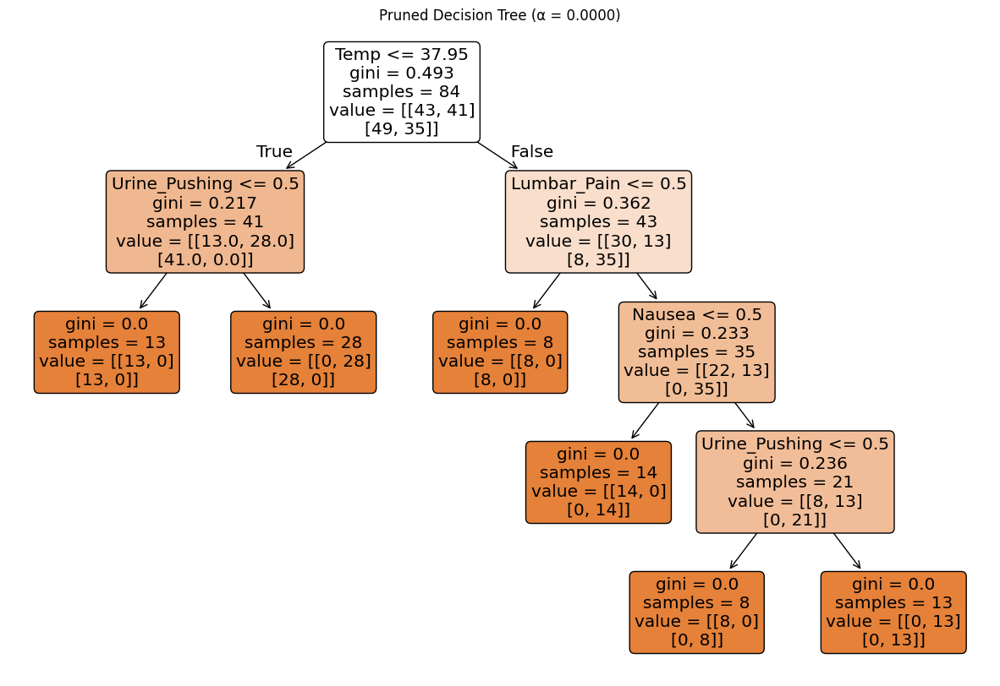


Pruned Tree Code:
def tree(Temp, Nausea, Lumbar_Pain, Urine_Pushing, Micturition_Pain, Burning_Urethra):
  if Temp <= 37.95000076293945:
    if Urine_Pushing <= 0.5:
      return [[1.0, 0.0], [1.0, 0.0]]
    else:  # if Urine_Pushing > 0.5
      return [[0.0, 1.0], [1.0, 0.0]]
  else:  # if Temp > 37.95000076293945
    if Lumbar_Pain <= 0.5:
      return [[1.0, 0.0], [1.0, 0.0]]
    else:  # if Lumbar_Pain > 0.5
      if Nausea <= 0.5:
        return [[1.0, 0.0], [0.0, 1.0]]
      else:  # if Nausea > 0.5
        if Urine_Pushing <= 0.5:
          return [[1.0, 0.0], [0.0, 1.0]]
        else:  # if Urine_Pushing > 0.5
          return [[0.0, 1.0], [0.0, 1.0]]

Best Alpha (Complexity Parameter): 0.0
Number of nodes in pruned tree: 11
Tree Depth: 4


In [11]:
# Splitting the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Creating an unpruned decision tree classifier  
original_tree = DecisionTreeClassifier(random_state=42)

# Training the original unpruned tree using the training data  
original_tree.fit(X_train, y_train)

# Computing the cost complexity pruning path for the decision tree 
path = original_tree.cost_complexity_pruning_path(X_train, y_train)

# Extracting the alpha values (regularization parameters) and impurity values 
ccp_alphas, impurities = path.ccp_alphas, path.impurities
 
clfs = []
alphas=[]

# Training decision tree classifiers with different complexity penalty values  
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(random_state=42, ccp_alpha=ccp_alpha)
    clf.fit(X_train, y_train)
    clfs.append(clf)
    alphas.append(ccp_alpha)
# Computing accuracy scores
train_scores = [clf.score(X_train, y_train) for clf in clfs]
test_scores = [clf.score(X_test, y_test) for clf in clfs]

print(f"Alphas:\n{alphas}")
print(f"Training Scores:\n{train_scores}")
print(f"Testing Scores:\n{test_scores}")

# Selecting the best alpha (maximizing test accuracy)
best_index = np.argmax(test_scores)
best_tree = clfs[best_index]
best_alpha = ccp_alphas[best_index]

# Visualizing the pruned decision tree 
plt.figure(figsize=(15, 10))
plot_tree(best_tree, feature_names=X.columns, 
          class_names=['No', 'Yes'], filled=True, rounded=True)
plt.title(f"Pruned Decision Tree (α = {best_alpha:.4f})")
plt.show()

# Generating tree code function same as above
def generate_tree_code(tree, feature_names):
    print("def tree(" + ", ".join(feature_names) + "):")
    
    def recurse(node, depth):
        indent = "  " * depth
        tree_ = tree.tree_
        
        if tree_.feature[node] != _tree.TREE_UNDEFINED:
            # Decision node
            name = feature_names[tree_.feature[node]]
            threshold = tree_.threshold[node]
            print(f"{indent}if {name} <= {threshold}:")
            recurse(tree_.children_left[node], depth + 1)
            print(f"{indent}else:  # if {name} > {threshold}")
            recurse(tree_.children_right[node], depth + 1)
        else:
            # Leaf node
            print(f"{indent}return {tree_.value[node].tolist()}")
    
    recurse(0, 1)

# Generating tree code for the pruned tree
print("\nPruned Tree Code:")
generate_tree_code(best_tree, X.columns)

print(f"\nBest Alpha (Complexity Parameter): {best_alpha}")
print(f"Number of nodes in pruned tree: {best_tree.tree_.node_count}")
print(f"Tree Depth: {best_tree.tree_.max_depth}")

## 2. The LASSO and Boosting for Regression

### (a) Obtain Data

In [12]:
# Path to the files
community_data = "../data/communities.data"
community_data_col_name = "../data/communities.names"

# Opening the .names file and reading its content line by line  
with open(community_data_col_name, "r") as file:
    lines = file.readlines()


column_names = []
for line in lines:
    if line.startswith("@attribute"):
        # Extracting the column name (e.g, "@attribute state numeric" -> "state")
        column_name = line.split()[1]
        column_names.append(column_name)

#print(column_names)

In [13]:
import pandas as pd

# Load the dataset
com_data = pd.read_csv(community_data, header=None, names=column_names, na_values="?")

In [14]:
com_data

,state,county,community,communityname,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
0,8,NaN,NaN,Lakewoodcity,1,0.19,0.33,0.02,0.90,0.12,...,0.12,0.26,0.20,0.06,0.04,0.90,0.5,0.32,0.14,0.20
1,53,NaN,NaN,Tukwilacity,1,0.00,0.16,0.12,0.74,0.45,...,0.02,0.12,0.45,NaN,NaN,NaN,NaN,0.00,NaN,0.67
2,24,NaN,NaN,Aberdeentown,1,0.00,0.42,0.49,0.56,0.17,...,0.01,0.21,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.43
3,34,5.0,81440.0,Willingborotownship,1,0.04,0.77,1.00,0.08,0.12,...,0.02,0.39,0.28,NaN,NaN,NaN,NaN,0.00,NaN,0.12
4,42,95.0,6096.0,Bethlehemtownship,1,0.01,0.55,0.02,0.95,0.09,...,0.04,0.09,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1989,12,NaN,NaN,TempleTerracecity,10,0.01,0.40,0.10,0.87,0.12,...,0.01,0.28,0.05,NaN,NaN,NaN,NaN,0.00,NaN,0.09
1990,6,NaN,NaN,Seasidecity,10,0.05,0.96,0.46,0.28,0.83,...,0.02,0.37,0.20,NaN,NaN,NaN,NaN,0.00,NaN,0.45
1991,9,9.0,80070.0,Waterburytown,10,0.16,0.37,0.25,0.69,0.04,...,0.08,0.32,0.18,0.08,0.06,0.78,0.0,0.91,0.28,0.23
1992,25,17.0,72600.0,Walthamcity,10,0.08,0.51,0.06,0.87,0.22,...,0.03,0.38,0.33,0.02,0.02,0.79,0.0,0.22,0.18,0.19


Spliting the dataset into training and test sets

In [15]:
#Use the first 1495 rows of data as the training set and the rest as the test set
train_data = com_data.iloc[:1495, :]
test_data = com_data.iloc[1495:, :]

### (b) Missing values

In [16]:
from sklearn.impute import SimpleImputer

#Identifying columns with missing values

def get_cols_to_impute(df):
    missing_percent = df.isna().mean().round(5) * 100  # # Calculating the percentage of missing values for each column
    cols_to_impute = missing_percent[missing_percent > 0].index.tolist()  # Selecting columns that are containing missing values
    print("Columns to impute and their missing value percentages:")
    print(missing_percent[missing_percent > 0])
    return cols_to_impute

In [17]:
def impute_missing_values(train_df, test_df, strategy='mean'):
    # Creating copies of the input DataFrames to avoid modifying the originals
    train_df = train_df.copy()
    test_df = test_df.copy()
    
    #assigning columns with missing values
    cols_to_impute = get_cols_to_impute(train_df)
    
    # Initialize the imputer with the specified strategy
    imputer = SimpleImputer(strategy=strategy, missing_values=np.nan)
    
    # Iterating through each column that is requiring imputation
    for col in cols_to_impute:
        # Fitting the imputer on the training data and transforming both training and test datasets
        train_df[[col]] = imputer.fit_transform(train_df[[col]])
        test_df[[col]] = imputer.transform(test_df[[col]])
    
    return train_df, test_df

In [18]:
train_imputed, test_imputed = impute_missing_values(train_data, test_data, strategy='mean')

print("\nImputed Training Data:")
print(train_imputed)

print("\nImputed Test Data:")
print(test_imputed)

Columns to impute and their missing value percentages:
county                  58.729
community               58.863
OtherPerCap              0.067
LemasSwornFT            84.013
LemasSwFTPerPop         84.013
LemasSwFTFieldOps       84.013
LemasSwFTFieldPerPop    84.013
LemasTotalReq           84.013
LemasTotReqPerPop       84.013
PolicReqPerOffic        84.013
PolicPerPop             84.013
RacialMatchCommPol      84.013
PctPolicWhite           84.013
PctPolicBlack           84.013
PctPolicHisp            84.013
PctPolicAsian           84.013
PctPolicMinor           84.013
OfficAssgnDrugUnits     84.013
NumKindsDrugsSeiz       84.013
PolicAveOTWorked        84.013
PolicCars               84.013
PolicOperBudg           84.013
LemasPctPolicOnPatr     84.013
LemasGangUnitDeploy     84.013
PolicBudgPerPop         84.013
dtype: float64

Imputed Training Data:
      state     county     community        communityname  fold  population  \
0         8  56.247974  46936.190244         Lakewoo

In [19]:
dataframe_imputed=pd.concat([train_imputed,test_imputed])

Removing Non Predictive Features from all the dataframes

In [20]:
# List of non-predictive features to drop
non_predictive_features = ['state', 'county', 'community', 'communityname', 'fold']

# Dropping non-predictive features from combined dataset
dataframe_imputed = dataframe_imputed.drop(columns=non_predictive_features)

# from Train and Test Data as well
train_imputed=train_imputed.drop(columns=non_predictive_features)
test_imputed=test_imputed.drop(columns=non_predictive_features)

In [21]:
dataframe_imputed

,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
0,0.19,0.33,0.02,0.90,0.12,0.17,0.34,0.47,0.29,0.32,...,0.12,0.26,0.20,0.060000,0.040000,0.900000,0.500000,0.32,0.140000,0.20
1,0.00,0.16,0.12,0.74,0.45,0.07,0.26,0.59,0.35,0.27,...,0.02,0.12,0.45,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.67
2,0.00,0.42,0.49,0.56,0.17,0.04,0.39,0.47,0.28,0.32,...,0.01,0.21,0.02,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.43
3,0.04,0.77,1.00,0.08,0.12,0.10,0.51,0.50,0.34,0.21,...,0.02,0.39,0.28,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.12
4,0.01,0.55,0.02,0.95,0.09,0.05,0.38,0.38,0.23,0.36,...,0.04,0.09,0.02,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1989,0.01,0.40,0.10,0.87,0.12,0.16,0.43,0.51,0.35,0.30,...,0.01,0.28,0.05,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.09
1990,0.05,0.96,0.46,0.28,0.83,0.32,0.69,0.86,0.73,0.14,...,0.02,0.37,0.20,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.45
1991,0.16,0.37,0.25,0.69,0.04,0.25,0.35,0.50,0.31,0.54,...,0.08,0.32,0.18,0.080000,0.060000,0.780000,0.000000,0.91,0.280000,0.23
1992,0.08,0.51,0.06,0.87,0.22,0.10,0.58,0.74,0.63,0.41,...,0.03,0.38,0.33,0.020000,0.020000,0.790000,0.000000,0.22,0.180000,0.19


### (c) Plot a correlation matrix

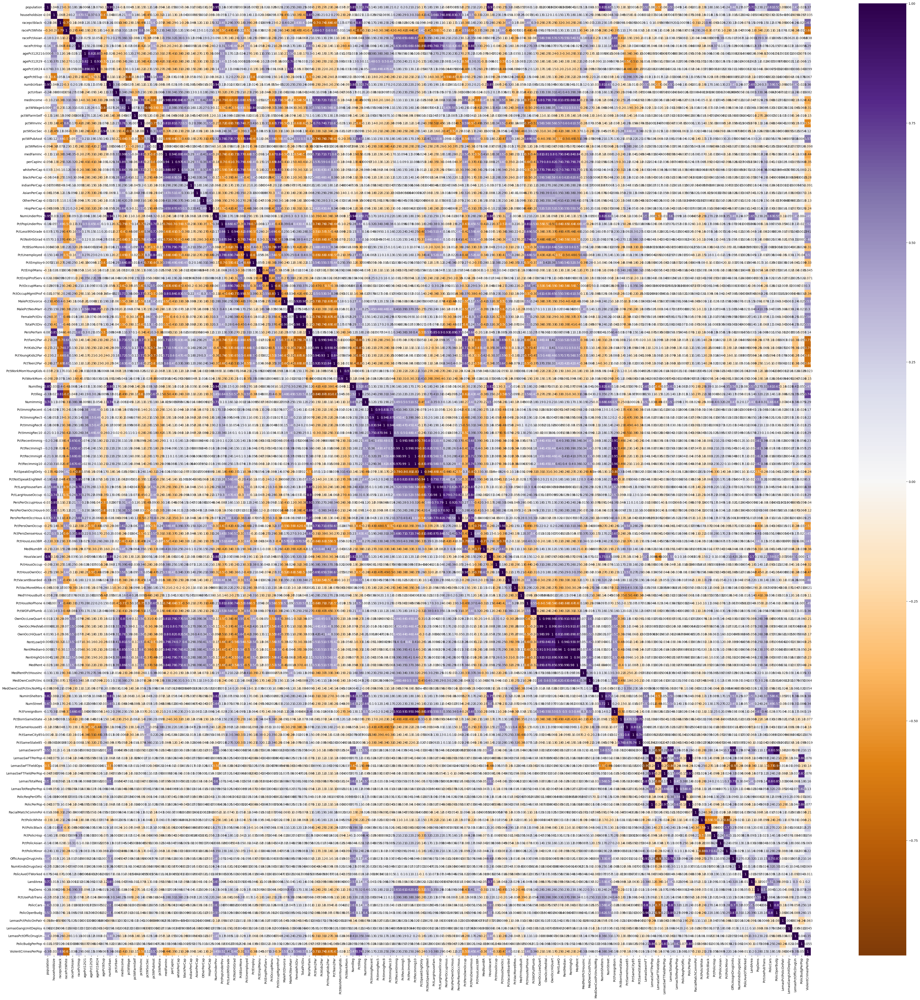

In [22]:
import seaborn as sns
import matplotlib.pyplot as plt
# Calculating the correlation matrix for the imputed dataset
plt.figure(figsize=(55, 55))
corr = dataframe_imputed.corr()
sns.heatmap(corr, cmap="PuOr", annot=True)
plt.show()

### (d) Calculate the Coefficient of Variation CV

In [23]:
def compute_variation_coefficient(data):
    # Calculating standard deviation and mean for each feature
    deviation = data.std()  
    average = data.mean() 
    
    # Calculating Coefficient of Variation (CV = standard deviation / mean)
    variation_coefficient = deviation / average
    
    # Creating a DataFrame to store the results
    variation_df = pd.DataFrame({
        'standard_deviation': deviation,
        'average': average,
        'variation_coefficient': variation_coefficient
    })
     
    return variation_df
# Computing the variation coefficient for the imputed dataset
variation_results = compute_variation_coefficient(dataframe_imputed)
print(variation_results)

                     standard_deviation   average  variation_coefficient
population                     0.126906  0.057593               2.203503
householdsize                  0.163717  0.463395               0.353298
racepctblack                   0.253442  0.179629               1.410920
racePctWhite                   0.244039  0.753716               0.323782
racePctAsian                   0.208877  0.153681               1.359162
...                                 ...       ...                    ...
LemasPctPolicOnPatr            0.085624  0.710740               0.120471
LemasGangUnitDeploy            0.162153  0.450052               0.360299
LemasPctOfficDrugUn            0.240328  0.094052               2.555266
PolicBudgPerPop                0.065815  0.191445               0.343782
ViolentCrimesPerPop            0.232985  0.237979               0.979015

[123 rows x 3 columns]


### (e) Scatter plots and box plots for highest CV features

In [24]:
variation_results_sorted = variation_results.sort_values(by='variation_coefficient', ascending=False)

# Displaying the sorted DataFrame
print(variation_results_sorted)

                     standard_deviation   average  variation_coefficient
NumStreet                      0.100400  0.022778               4.407702
NumInShelters                  0.102607  0.029438               3.485481
NumIlleg                       0.108671  0.036294               2.994196
NumImmig                       0.087189  0.030060               2.900497
LemasPctOfficDrugUn            0.240328  0.094052               2.555266
...                                 ...       ...                    ...
NumKindsDrugsSeiz              0.081172  0.552690               0.146867
RacialMatchCommPol             0.090637  0.683438               0.132619
PctPolicWhite                  0.088443  0.725577               0.121894
LemasPctPolicOnPatr            0.085624  0.710740               0.120471
LemasSwFTFieldOps              0.052865  0.920089               0.057457

[123 rows x 3 columns]


In [25]:
import math

# Calculating the number of features to pick
num_features = int(math.floor(np.sqrt(128)))  # b√128 ≈ 11

# Selecting the top features with the highest CV
top_features = variation_results_sorted.index[:num_features]

# Displaying the selected features
print(f"Top {num_features} features with the highest CV:")
print(top_features)

Top 11 features with the highest CV:
Index(['NumStreet', 'NumInShelters', 'NumIlleg', 'NumImmig',
       'LemasPctOfficDrugUn', 'NumUnderPov', 'population', 'numbUrban',
       'HousVacant', 'LandArea', 'racePctHisp'],
      dtype='object')


##### Scatter plot

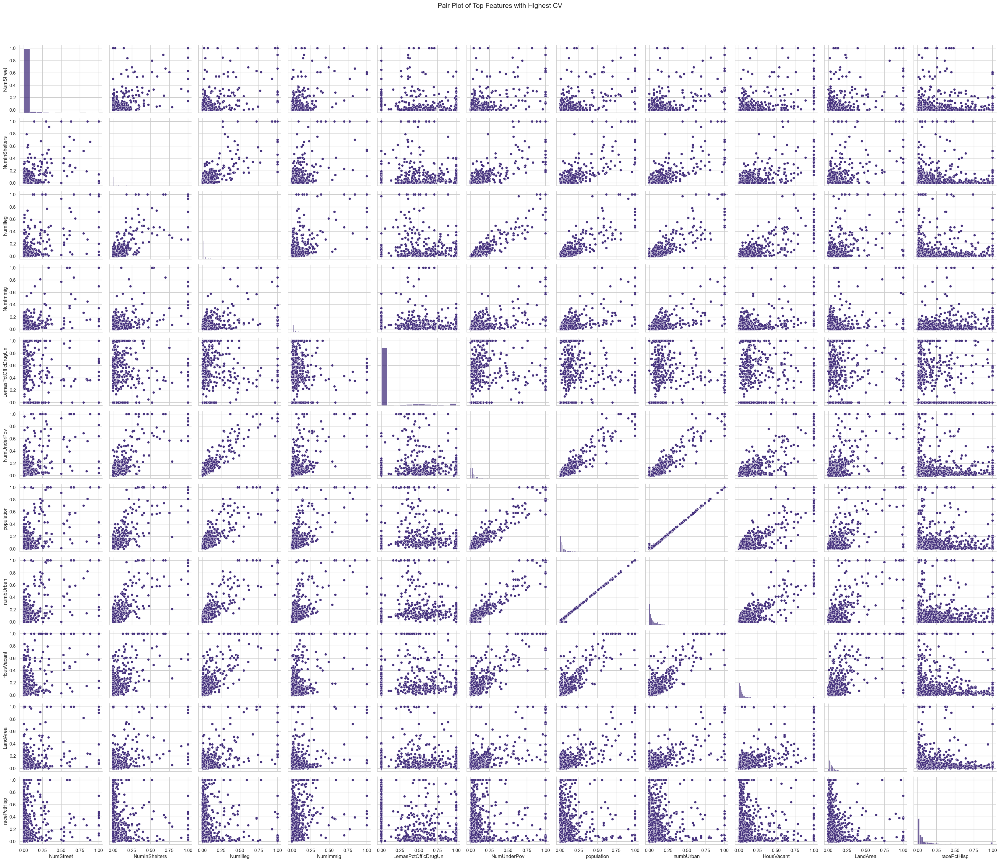

In [26]:
def get_pairplot(data, top_features):
    # Seting the style for the plot
    sns.set(style="whitegrid", palette="viridis")
    
    # Creating the pair plot
    pair_plot = sns.pairplot(data[top_features], height=2.5, aspect=1.2)
    
    pair_plot.fig.suptitle("Pair Plot of Top Features with Highest CV", y=1.03, fontsize=16)
    
    plt.tight_layout()
    plt.show()

get_pairplot(dataframe_imputed, top_features)

##### Box Plot

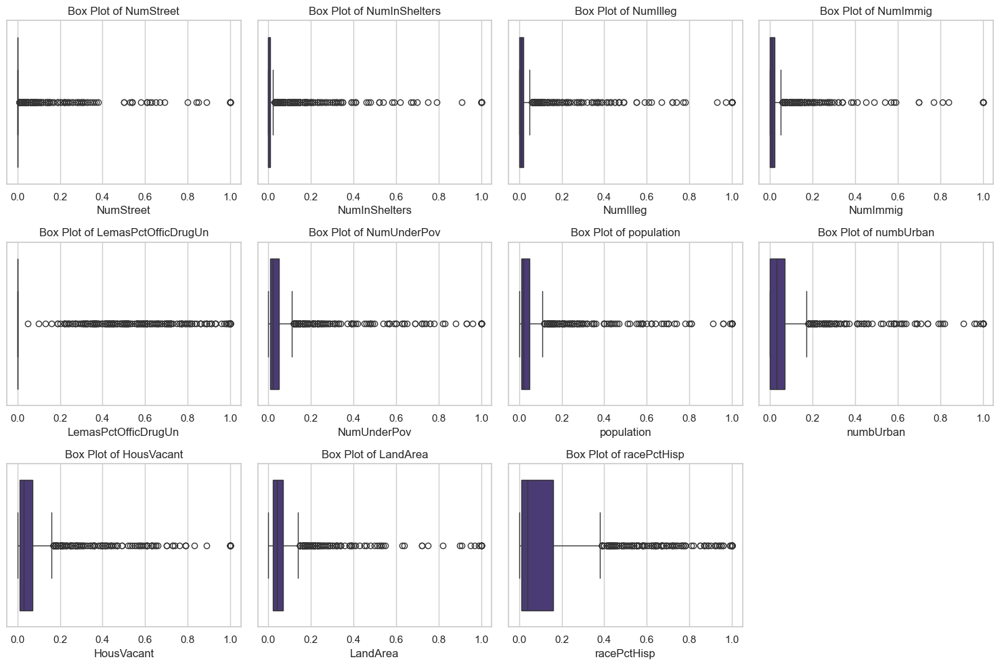

In [27]:
# Box plots for the selected features
plt.figure(figsize=(15, 10))
for i, feature in enumerate(top_features, 1):
    plt.subplot(3, 4, i)
    sns.boxplot(x=dataframe_imputed[feature])
    plt.title(f"Box Plot of {feature}")
plt.tight_layout()
plt.show()

##### Can you draw conclusions about significance of those features, just by the scatter plots?<br>
The scatter plots show data points that are widely dispersed, making it difficult to identify clear linear relationships or trends between the features and the target variable<br>
While scatter plots show relationships between pairs of features, box plots provide a deeper understanding of the distribution and variability of individual features.Together, they can help identify which features are likely to be significant for modeling<br><br>

### (f) Fit a linear model

In [28]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import statsmodels.api as sm

# Preparing the training and test datasets by dropping the target variable
X_train = train_imputed.drop(columns=['ViolentCrimesPerPop'])
y_train = train_imputed['ViolentCrimesPerPop']
X_test = test_imputed.drop(columns=['ViolentCrimesPerPop'])
y_test = test_imputed['ViolentCrimesPerPop']

# Adding a constant to the training dataset to include the intercept in the model
X_train = sm.add_constant(X_train)

# Fitting the linear regression model on the training data
LR_model = sm.OLS(y_train, X_train).fit()
y_train_pred = LR_model.predict(X_train)

# Calculating the mean squared error (MSE) for the training data
train_mse_LR = mean_squared_error(y_train, y_train_pred)

X_test = sm.add_constant(X_test)
y_test_pred = LR_model.predict(X_test)

# Calculating the mean squared error (MSE) for the testing data
test_mse_LR = mean_squared_error(y_test, y_test_pred)

display(LR_model.summary())

<class 'statsmodels.iolib.summary.Summary'>
"""
                             OLS Regression Results                            
===============================================================================
Dep. Variable:     ViolentCrimesPerPop   R-squared:                       0.711
Model:                             OLS   Adj. R-squared:                  0.686
Method:                  Least Squares   F-statistic:                     27.94
Date:                 Wed, 26 Mar 2025   Prob (F-statistic):          6.56e-291
Time:                         22:49:20   Log-Likelihood:                 955.40
No. Observations:                 1495   AIC:                            -1667.
Df Residuals:                     1373   BIC:                            -1019.
Df Model:                          121                                         
Covariance Type:             nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     0.4544      0.904      0.503      0.615      -1.319       2.228
population               -0.0199      0.477     -0.042      0.967      -0.955       0.916
householdsize            -0.0157      0.098     -0.161      0.872      -0.207       0.176
racepctblack              0.2848      0.060      4.754      0.000       0.167       0.402
racePctWhite              0.0106      0.067      0.159      0.874      -0.120       0.141
racePctAsian             -0.0278      0.041     -0.670      0.503      -0.109       0.054
racePctHisp               0.0180      0.065      0.275      0.784      -0.110       0.146
agePct12t21               0.1792      0.129      1.387      0.166      -0.074       0.433
agePct12t29              -0.3451      0.186     -1.858      0.063      -0.709       0.019
agePct16t24              -0.1237      0.198     -0.626      0.531      -0.511       0.264
agePct65up                0.0597      0.124      0.481      0.630      -0.184       0.303
numbUrban                -0.1260      0.465     -0.271      0.786      -1.038       0.786
pctUrban                  0.0484      0.019      2.581      0.010       0.012       0.085
medIncome                -0.1784      0.202     -0.881      0.378      -0.575       0.219
pctWWage                 -0.1399      0.107     -1.309      0.191      -0.350       0.070
pctWFarmSelf              0.0460      0.023      1.960      0.050   -3.35e-05       0.092
pctWInvInc               -0.2031      0.081     -2.505      0.012      -0.362      -0.044
pctWSocSec                0.1368      0.125      1.092      0.275      -0.109       0.383
pctWPubAsst               0.0601      0.054      1.109      0.268      -0.046       0.166
pctWRetire               -0.1249      0.045     -2.802      0.005      -0.212      -0.037
medFamInc                 0.3049      0.189      1.617      0.106      -0.065       0.675
perCapInc                -0.0485      0.222     -0.219      0.827      -0.484       0.387
whitePerCap              -0.1923      0.179     -1.072      0.284      -0.544       0.160
blackPerCap              -0.0401      0.030     -1.358      0.175      -0.098       0.018
indianPerCap             -0.0436      0.023     -1.911      0.056      -0.088       0.001
AsianPerCap               0.0301      0.022      1.381      0.168      -0.013       0.073
OtherPerCap               0.0304      0.022      1.364      0.173      -0.013       0.074
HispPerCap                0.0330      0.029      1.150      0.250      -0.023       0.089
NumUnderPov               0.0737      0.192      0.383      0.702      -0.303       0.451
PctPopUnderPov           -0.2035      0.074     -2.736      0.006      -0.349      -0.058
PctLess9thGrade          -0.0584      0.079     -0.743      0.457      -0.213       0.096
PctNotHSGrad

In [29]:
print(f"Train Mean Squared Error: {train_mse_LR}")
print(f"Test Mean Squared Error: {test_mse_LR}")

Train Mean Squared Error: 0.016309485245879014
Test Mean Squared Error: 0.018141971135529983


### (g) Fit a ridge regression model

In [30]:
from sklearn.linear_model import RidgeCV
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, r2_score

# Generating lambdas (alphas in sklearn)  Ridge Regression
alphas = [10 ** i for i in range(-10, 11)]

# Initializing cross-validation strategy with 5 splits
cv = KFold(n_splits=5, shuffle=True, random_state=1)

# Initializing the RidgeCV model with defined alphas and cross-validation
ridge_cv = RidgeCV(
    alphas=alphas,
    cv=cv,
    scoring='neg_mean_squared_error'
)
# Fitting the Ridge Regression model on the training data
ridge_cv.fit(X_train, y_train)

# predictions on test set
predicted_Y = ridge_cv.predict(X_test)

# Calculating the mean squared error (MSE) and R^2 for the test data
test_mse_ridge = mean_squared_error(y_test, predicted_Y)
test_r2_ridge = r2_score(y_test, predicted_Y)

ridge_stats = {
    "Chosen Alpha": [ridge_cv.alpha_],
    "Test MSE": [test_mse_ridge],
    "Test R²": [test_r2_ridge],
    "Number of Features": [X_train.shape[1]]
}

print("Ridge Regression Results:")
print(pd.DataFrame(ridge_stats).T)
print("\nModel coefficients:\n", ridge_cv.coef_)

Ridge Regression Results:
                             0
Chosen Alpha          1.000000
Test MSE              0.017732
Test R²               0.627119
Number of Features  123.000000

Model coefficients:
 [ 0.         -0.02218683  0.00533406  0.24770056 -0.02854747 -0.03525011
  0.00488145  0.07593574 -0.20005022 -0.05283692  0.05853129 -0.02381083
  0.04417786  0.04228882 -0.07944258  0.03607447 -0.13826381  0.07286816
  0.0610478  -0.11206067  0.05953785 -0.04317626 -0.10251048 -0.03041957
 -0.03492375  0.03091257  0.02848679  0.02870661 -0.01164272 -0.14569446
 -0.05383706  0.02577329  0.0446426  -0.00521168  0.17215477 -0.0387118
 -0.00547298  0.05240801  0.02928028  0.16076179  0.14217624 -0.10834193
 -0.03717521  0.04609569 -0.06324206 -0.13159801 -0.03938714 -0.02732264
  0.0147366  -0.14742415 -0.05573721  0.08929236 -0.08951767  0.00246973
  0.00485005  0.00205875 -0.01969917 -0.03106151  0.00067123  0.02873711
  0.05924239 -0.00287729 -0.10757545 -0.03673015 -0.08606616  0.1460

### (h) Fit a LASSO model

##### Normal LASSO

In [31]:
from sklearn.linear_model import LassoCV

# Generating lambdas (alphas in sklearn) for Lasso Regression
lambdas = [10 ** i for i in range(-10, 11)]

# Initializing LassoCV model with cross-validation and a maximum number of iterations
lasso_orig = LassoCV(
    alphas=lambdas,
    cv=KFold(n_splits=5, shuffle=True, random_state=1),
    max_iter=10000
)

lasso_orig.fit(X_train, y_train)


y_pred_orig = lasso_orig.predict(X_test)
# Calculating the mean squared error (MSE) for the test data without standardized features
mse_orig = mean_squared_error(y_test, y_pred_orig)


##### LASSO with standardized features

In [32]:
from sklearn.preprocessing import StandardScaler

# Initializing the StandardScaler to standardize the features
scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)

# Transforming the test data using the same scaler fitted on the training data
X_test_std = scaler.transform(X_test)

# Initializing the LassoCV model with the specified alphas, cross-validation, and max iterations
lasso_std = LassoCV(
    alphas=lambdas,
    cv=KFold(n_splits=5, shuffle=True, random_state=1),
    max_iter=10000
)

# Fitting the Lasso model on the standardized training data
lasso_std.fit(X_train_std, y_train)

# Predictions and metrics
y_pred_std = lasso_std.predict(X_test_std)

# Calculating the mean squared error (MSE) for the standardized test data
mse_std = mean_squared_error(y_test, y_pred_std)


In [33]:
def show_selected_features(model, feature_names):
    
    #  Identifying non-zero coefficients from the model
    selected_mask = model.coef_ != 0
    selected_features = feature_names[selected_mask]

     # Rounding the coefficients of the selected features
    selected_coefs = np.round(model.coef_[selected_mask], 4)
    
    feature_results = pd.DataFrame({
        'Feature': selected_features,
        'Coefficient': selected_coefs
    }).sort_values('Coefficient', key=abs, ascending=False)# Sorting by the absolute value of coefficients
    
    print(f"\nSelected {len(feature_results)} features:")
    print(feature_results.to_string(index=False))
    
    return feature_results

print("Original LASSO Features:")
original_features = show_selected_features(lasso_orig, X_train.columns)

print("\nStandardized LASSO Features:") 
std_features = show_selected_features(lasso_std, X_train.columns)

Original LASSO Features:

Selected 78 features:
              Feature  Coefficient
          agePct12t29      -0.2911
         racepctblack       0.2731
     PctPersDenseHous       0.2311
          PctKids2Par      -0.1981
              MedRent       0.1734
            NumStreet       0.1696
             RentLowQ      -0.1651
            PctEmploy       0.1550
       MalePctNevMarr       0.1507
       PctPopUnderPov      -0.1501
           PctWorkMom      -0.1347
       MalePctDivorce       0.1326
           HousVacant       0.1303
           pctWInvInc      -0.1101
           pctWRetire      -0.1098
     PolicReqPerOffic       0.0967
         FemalePctDiv      -0.0956
             PctIlleg       0.0956
             pctWWage      -0.0932
    MedRentPctHousInc       0.0906
    PctLargHouseOccup      -0.0895
 LemasSwFTFieldPerPop       0.0836
             NumImmig      -0.0812
  PctNotSpeakEnglWell      -0.0808
MedOwnCostPctIncNoMtg      -0.0796
          agePct12t21       0.0760
     Pc

In [34]:
# Results comparison
Lasso_stats = pd.DataFrame({
    'Model': ['LASSO (original)', 'LASSO (standardized)'],
    'Test MSE': [mse_orig, mse_std],
    'Lambda': [lasso_orig.alpha_, lasso_std.alpha_],
    'Features Selected': [sum(lasso_orig.coef_ != 0), sum(lasso_std.coef_ != 0)]
})

print("LASSO Model Comparison:")
print(pd.DataFrame(Lasso_stats).T)

LASSO Model Comparison:
                                  0                     1
Model              LASSO (original)  LASSO (standardized)
Test MSE                   0.017786              0.017758
Lambda                       0.0001                 0.001
Features Selected                78                    68


1. Both models show virtually the same test MSE (0.01779 vs 0.01776), indicating standardization didn't significantly impact predictive accuracy.<br>
2. The standardized version selected 10 fewer features (68 vs 78) while maintaining equal performance, suggesting it creates a more efficient model.

### (i) Fit a PCR model

In [35]:
from sklearn.decomposition import PCA
from sklearn.model_selection import cross_val_score

# Computing MSE for all possible dimensions (number of components in PCA)
mse_results_PCR = {}
max_components = min(X_train.shape[0], X_train.shape[1])

# Iterating through possible component numbers (1 to max_components)
for n in range(1, max_components + 1):
    pca = PCA(n_components=n)
    X_pca = pca.fit_transform(X_train) # Applying PCA transformation to the data
    # Computing the mean squared error (MSE) using cross-validation
    mse = -cross_val_score(LinearRegression(), X_pca, y_train,
                          cv=KFold(n_splits=5, shuffle=True, random_state=1),
                          scoring='neg_mean_squared_error').mean() #Converting the score back to a standard MSE (positive values)
    mse_results_PCR[n] = mse

# Finding the optimal number of components that minimizes the MSE
best_m = min(mse_results_PCR, key=mse_results_PCR.get)
best_mse_PCR = mse_results_PCR[best_m]

# Final model with optimal components
pca = PCA(n_components=best_m)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

# Training the linear regression model with the PCA-transformed data
pcr = LinearRegression()
pcr.fit(X_train_pca, y_train)
y_pred = pcr.predict(X_test_pca)


PCR_stats = {
    "Optimal Components": [best_m],
    "Validation MSE": [best_mse_PCR],
    "Test MSE": [mean_squared_error(y_test, y_pred)],
}

print("PCR Results Summary:")
print(pd.DataFrame(PCR_stats).T)

PCR Results Summary:
                            0
Optimal Components  96.000000
Validation MSE       0.019322
Test MSE             0.018472


### (j) Fit a boosting tree

In [36]:
#pip install xgboost

In [37]:
from xgboost import XGBRegressor

# Generating lambdas (alphas in sklearn) for xgboost
alphas = [10 ** i for i in range(-10, 11)]

# Storing results
xgboost_results = {}

for alpha in alphas:
    # Initializing XGBoost regressor with the current alpha value
    model = XGBRegressor(
        objective='reg:squarederror',
        reg_alpha=alpha,
        random_state=1
    )
    
     # Performing 5-fold cross-validation
    scores = cross_val_score(
        model,
        X_train,
        y_train,
        cv=KFold(n_splits=5, shuffle=True, random_state=1),
        scoring='neg_mean_squared_error'
    )
    
    # Taking the absolute value and averaging the results
    avg_mse_xgb = abs(scores).mean()
    xgboost_results[alpha] = round(avg_mse_xgb, 5)

# Identifying the best alpha that gives the lowest MSE
best_alpha_xgb = min(xgboost_results, key=xgboost_results.get)
best_mse_xgb = xgboost_results[best_alpha_xgb]

# Training the final XGBoost model using the best alpha value
final_xgb_model = XGBRegressor(
    objective='reg:squarederror',
    reg_alpha=best_alpha_xgb,
    random_state=1
)
final_xgb_model.fit(X_train, y_train)

# Test evaluation
test_pred_xgb = final_xgb_model.predict(X_test)
test_mse_xgb = mean_squared_error(y_test, test_pred_xgb)

# Stats summary
Xgb_stats = {
    "Best Alpha": [best_alpha_xgb],
    "Validation MSE": [best_mse_xgb],
    "Test MSE": [test_mse_xgb],
    "Features Used": [sum(final_xgb_model.feature_importances_ > 0)]
}
print(xgboost_results)
print("XGBoost with L1 Penalty Results:")
print(pd.DataFrame(Xgb_stats).T)

{1e-10: 0.02256, 1e-09: 0.02256, 1e-08: 0.02256, 1e-07: 0.02256, 1e-06: 0.02257, 1e-05: 0.02258, 0.0001: 0.02273, 0.001: 0.02291, 0.01: 0.02254, 0.1: 0.0223, 1: 0.02132, 10: 0.02157, 100: 0.0565, 1000: 0.0565, 10000: 0.0565, 100000: 0.0565, 1000000: 0.0565, 10000000: 0.0565, 100000000: 0.0565, 1000000000: 0.0565, 10000000000: 0.0565}
XGBoost with L1 Penalty Results:
                         0
Best Alpha        1.000000
Validation MSE    0.021320
Test MSE          0.017747
Features Used   118.000000
